In [32]:
from __future__ import absolute_import, division, print_function, unicode_literals

#!pip install -q tensorflow==2.0.0-beta1
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import datasets, layers, models, preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from skimage.color import rgb2lab, lab2rgb, rgb2gray, xyz2lab
from skimage.io import imsave
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from bs4 import BeautifulSoup
import requests
import cv2
import PIL.Image
import urllib
import time
import glob
import random
print(tf.__version__)

2.0.0-beta1


In [2]:
IMAGE_SIZE = 400

In [23]:
def load_img_to_np_array(image_path, show_image = False):
    raw_image = load_img(image_path)
    resized_image = raw_image.resize((IMAGE_SIZE, IMAGE_SIZE))
    image_arr = img_to_array(resized_image)
    imaimage_arrge = np.array(image_arr, dtype=float)

    if (show_image):
        plt.figure()
        plt.imshow(resized_image)
        
#     print(resized_image)
#     print(image_arr.shape)
    return resized_image, image_arr

def convert_rgb2lab(image_arr):
    X = rgb2lab(1.0/255*image_arr)[:,:,0]
    Y = rgb2lab(1.0/255*image_arr)[:,:,1:]
    Y /= 128
    X = X.reshape(IMAGE_SIZE, IMAGE_SIZE, 1)
    Y = Y.reshape(IMAGE_SIZE, IMAGE_SIZE, 2)
    
#     print(X.shape)
#     print(Y.shape)
    
#     print(Y.min())
#     print(Y.max())
    
    return X, Y

def show_images(original, model_prediction, grayscale):
    
    plt.figure(figsize=(20,20))

    plt.subplot(3,3,1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(original)
    plt.xlabel("original")

    plt.subplot(3,3,2)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(grayscale, cmap =plt.cm.gray)
    plt.xlabel("grayscale")

    plt.subplot(3,3,3)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(model_prediction)
    plt.xlabel("rgb prediction")

    plt.show()
    
def predict(m_model, original_image, inputX):
    output = m_model.predict(inputX)
    output *= 128
    # Output colorizations
    cur = np.zeros((IMAGE_SIZE, IMAGE_SIZE, 3))
    cur[:,:,0] = inputX[0][:,:,0]
    cur[:,:,1:] = output[0]
    
    print(inputX.shape)
    print(output.shape)

    predicted_image = lab2rgb(cur)
    show_images(original_image, predicted_image, rgb2gray(predicted_image))
    
def load_and_preprocess_images(images_path, show_images=False):
    images_arr = []
    for i in range(len(images_path)):
        img, arr = load_img_to_np_array(images_path[i], show_image=show_images)
        
        if not is_gray_scale(img):
            images_arr.append((img, arr))
            
    print(str(len(images_arr)) + " images were loaded successfully")
    return np.array(images_arr)

def convert_all_images_rgb2lab(images_arr):
    input_x = []
    output_y = []
    
    for image_arr in images_arr:
        in_x, out_y = convert_rgb2lab(image_arr[1])
        input_x.append(in_x)
        output_y.append(out_y)
    
    return np.array(input_x), np.array(output_y)

In [119]:
NUM_OF_IMAGES = 10
EPOCHS = 400

In [132]:
train_images = list(glob.glob('train/*'))
train_images = [str(path) for path in train_images]
# random.shuffle(train_images)

print(len(train_images))
# train_images = train_images[:NUM_OF_IMAGES]
train_images = train_images[6:6 + NUM_OF_IMAGES]
print(len(train_images))
images_and_arrs = load_and_preprocess_images(train_images)

673
10
8 images were loaded successfully
8


IndexError: index 8 is out of bounds for axis 0 with size 8

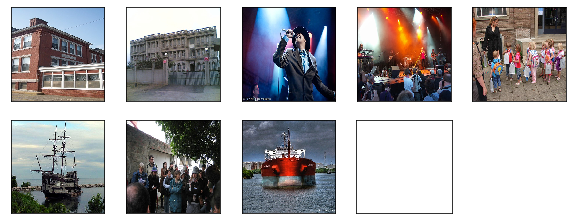

In [121]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images_and_arrs[i][0])
plt.show()

In [122]:
input_x, output_y = convert_all_images_rgb2lab(images_and_arrs)

print("input_x shape = " + str(input_x.shape))
print("output_y shape = " + str(output_y.shape))

for out_y in output_y:
    print(out_y.min())
    print(out_y.max())

input_x shape = (8, 400, 400, 1)
output_y shape = (8, 400, 400, 2)
-0.2345603402160102
0.24706199427894762
-0.3826048396647203
0.40248266630409024
-0.4668816062846376
0.5006045827470668
-0.34915060020106814
0.7355582528721193
-0.5318568730445967
0.6089133467210373
-0.23523103387069424
0.3357472426986469
-0.39118969824556654
0.5264728307638414
-0.2710549603397857
0.5928624736632857


In [123]:
# Building the neural network
model = keras.Sequential()
model.add(layers.Conv2D(8, (3, 3), activation='relu', padding='same', strides=2, input_shape=(None, None, 1)))
model.add(layers.Conv2D(8, (3, 3), activation='relu', padding='same'))
model.add(layers.Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(layers.Conv2D(16, (3, 3), activation='relu', padding='same', strides=2))
model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same', strides=2))
model.add(layers.UpSampling2D((2, 2)))
model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2, 2)))
model.add(layers.Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2, 2)))
model.add(layers.Conv2D(2, (3, 3), activation='tanh', padding='same'))

In [124]:
# Finish model
model.compile(optimizer='rmsprop',
              loss='mse',
              metrics=['accuracy'])
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_45 (Conv2D)           (None, None, None, 8)     80        
_________________________________________________________________
conv2d_46 (Conv2D)           (None, None, None, 8)     584       
_________________________________________________________________
conv2d_47 (Conv2D)           (None, None, None, 16)    1168      
_________________________________________________________________
conv2d_48 (Conv2D)           (None, None, None, 16)    2320      
_________________________________________________________________
conv2d_49 (Conv2D)           (None, None, None, 32)    4640      
_________________________________________________________________
conv2d_50 (Conv2D)           (None, None, None, 32)    9248      
_________________________________________________________________
up_sampling2d_15 (UpSampling (None, None, None, 32)   

In [125]:
history = model.fit(x=input_x, 
          y=output_y,
          batch_size=25,
          epochs=EPOCHS)

Train on 8 samples
Epoch 1/400
8/8 [==============================] - 1s 170ms/sample - loss: 0.0336 - accuracy: 0.4390
Epoch 2/400
8/8 [==============================] - 1s 118ms/sample - loss: 0.0162 - accuracy: 0.5621
Epoch 3/400
8/8 [==============================] - 1s 118ms/sample - loss: 0.0128 - accuracy: 0.5296
Epoch 4/400
8/8 [==============================] - 1s 116ms/sample - loss: 0.0122 - accuracy: 0.5494
Epoch 5/400
8/8 [==============================] - 1s 118ms/sample - loss: 0.0121 - accuracy: 0.5526
Epoch 6/400
8/8 [==============================] - 1s 123ms/sample - loss: 0.0121 - accuracy: 0.5546
Epoch 7/400
8/8 [==============================] - 1s 128ms/sample - loss: 0.0121 - accuracy: 0.5560
Epoch 8/400
8/8 [==============================] - 1s 132ms/sample - loss: 0.0121 - accuracy: 0.5570
Epoch 9/400
8/8 [==============================] - 1s 147ms/sample - loss: 0.0120 - accuracy: 0.5576
Epoch 10/400
8/8 [==============================] - 1s 135ms/sample - lo

Epoch 82/400
8/8 [==============================] - 1s 118ms/sample - loss: 0.0108 - accuracy: 0.5638
Epoch 83/400
8/8 [==============================] - 1s 117ms/sample - loss: 0.0111 - accuracy: 0.5641
Epoch 84/400
8/8 [==============================] - 1s 121ms/sample - loss: 0.0107 - accuracy: 0.5641
Epoch 85/400
8/8 [==============================] - 1s 117ms/sample - loss: 0.0103 - accuracy: 0.5644
Epoch 86/400
8/8 [==============================] - 1s 131ms/sample - loss: 0.0102 - accuracy: 0.5635
Epoch 87/400
8/8 [==============================] - 1s 141ms/sample - loss: 0.0104 - accuracy: 0.5678
Epoch 88/400
8/8 [==============================] - 1s 147ms/sample - loss: 0.0101 - accuracy: 0.5630
Epoch 89/400
8/8 [==============================] - 1s 143ms/sample - loss: 0.0103 - accuracy: 0.5616
Epoch 90/400
8/8 [==============================] - 1s 118ms/sample - loss: 0.0102 - accuracy: 0.5616
Epoch 91/400
8/8 [==============================] - 1s 117ms/sample - loss: 0.0104

Epoch 162/400
8/8 [==============================] - 1s 119ms/sample - loss: 0.0092 - accuracy: 0.5688
Epoch 163/400
8/8 [==============================] - 1s 120ms/sample - loss: 0.0094 - accuracy: 0.5663
Epoch 164/400
8/8 [==============================] - 1s 117ms/sample - loss: 0.0092 - accuracy: 0.5691
Epoch 165/400
8/8 [==============================] - 1s 116ms/sample - loss: 0.0099 - accuracy: 0.5565
Epoch 166/400
8/8 [==============================] - 1s 117ms/sample - loss: 0.0096 - accuracy: 0.5658
Epoch 167/400
8/8 [==============================] - 1s 116ms/sample - loss: 0.0099 - accuracy: 0.5766
Epoch 168/400
8/8 [==============================] - 1s 115ms/sample - loss: 0.0087 - accuracy: 0.5692
Epoch 169/400
8/8 [==============================] - 1s 123ms/sample - loss: 0.0087 - accuracy: 0.5693
Epoch 170/400
8/8 [==============================] - 1s 120ms/sample - loss: 0.0096 - accuracy: 0.6151
Epoch 171/400
8/8 [==============================] - 1s 115ms/sample - lo

Epoch 242/400
8/8 [==============================] - 1s 116ms/sample - loss: 0.0090 - accuracy: 0.5770
Epoch 243/400
8/8 [==============================] - 1s 113ms/sample - loss: 0.0097 - accuracy: 0.5813
Epoch 244/400
8/8 [==============================] - 1s 113ms/sample - loss: 0.0090 - accuracy: 0.5785
Epoch 245/400
8/8 [==============================] - 1s 114ms/sample - loss: 0.0084 - accuracy: 0.5715
Epoch 246/400
8/8 [==============================] - 1s 112ms/sample - loss: 0.0080 - accuracy: 0.5896
Epoch 247/400
8/8 [==============================] - 1s 116ms/sample - loss: 0.0090 - accuracy: 0.5737
Epoch 248/400
8/8 [==============================] - 1s 121ms/sample - loss: 0.0078 - accuracy: 0.5739
Epoch 249/400
8/8 [==============================] - 1s 116ms/sample - loss: 0.0074 - accuracy: 0.5729
Epoch 250/400
8/8 [==============================] - 1s 119ms/sample - loss: 0.0076 - accuracy: 0.6236
Epoch 251/400
8/8 [==============================] - 1s 117ms/sample - lo

Epoch 322/400
8/8 [==============================] - 1s 118ms/sample - loss: 0.0087 - accuracy: 0.6264
Epoch 323/400
8/8 [==============================] - 1s 115ms/sample - loss: 0.0072 - accuracy: 0.5737
Epoch 324/400
8/8 [==============================] - 1s 113ms/sample - loss: 0.0068 - accuracy: 0.5705
Epoch 325/400
8/8 [==============================] - 1s 114ms/sample - loss: 0.0075 - accuracy: 0.6252
Epoch 326/400
8/8 [==============================] - 1s 117ms/sample - loss: 0.0089 - accuracy: 0.5659
Epoch 327/400
8/8 [==============================] - 1s 116ms/sample - loss: 0.0083 - accuracy: 0.6282
Epoch 328/400
8/8 [==============================] - 1s 112ms/sample - loss: 0.0066 - accuracy: 0.5756
Epoch 329/400
8/8 [==============================] - 1s 121ms/sample - loss: 0.0062 - accuracy: 0.5771
Epoch 330/400
8/8 [==============================] - 1s 120ms/sample - loss: 0.0070 - accuracy: 0.6129
Epoch 331/400
8/8 [==============================] - 1s 116ms/sample - lo

In [126]:
num_of_photos = str(len(train_images))
num_of_epochs = str(EPOCHS)

model_name = 'Colorize-V3-' + num_of_photos + 'photos-'+ num_of_epochs + 'epochs'
MODEL_PATH = 'models/'+ model_name +'.h5'
print('model will be saved as: ' + str(MODEL_PATH))

model will be saved as: models/Colorize-V3-10photos-400epochs.h5


In [127]:
model.save(MODEL_PATH)

In [144]:
# Recreate the exact same model, including weights and optimizer.
new_model = keras.models.load_model(MODEL_PATH)
new_model.summary()

# Recreate the exact same model, including weights and optimizer.
first_model = keras.models.load_model('models/Colorize-V2.h5')
first_model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_45 (Conv2D)           (None, None, None, 8)     80        
_________________________________________________________________
conv2d_46 (Conv2D)           (None, None, None, 8)     584       
_________________________________________________________________
conv2d_47 (Conv2D)           (None, None, None, 16)    1168      
_________________________________________________________________
conv2d_48 (Conv2D)           (None, None, None, 16)    2320      
_________________________________________________________________
conv2d_49 (Conv2D)           (None, None, None, 32)    4640      
_________________________________________________________________
conv2d_50 (Conv2D)           (None, None, None, 32)    9248      
_________________________________________________________________
up_sampling2d_15 (UpSampling (None, None, None, 32)   

(1, 400, 400, 1)
(1, 400, 400, 2)


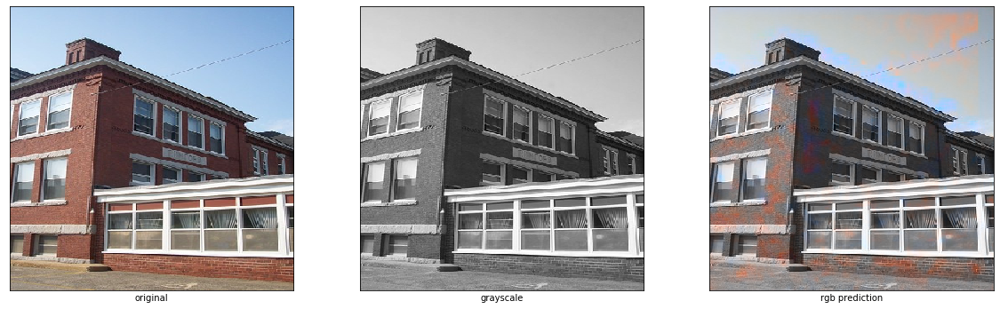

(1, 400, 400, 1)
(1, 400, 400, 2)


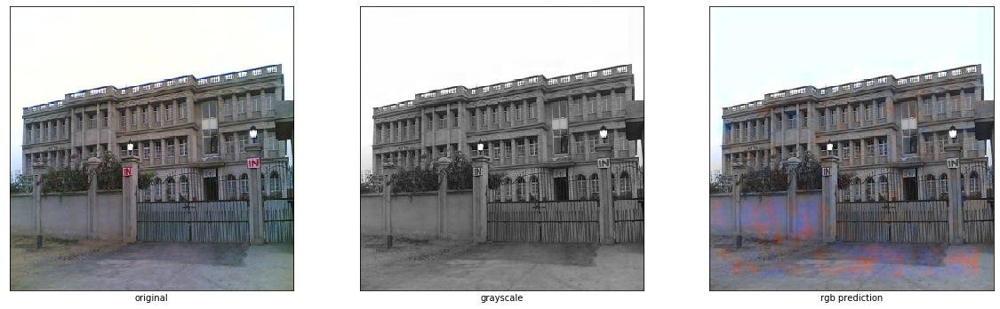

(1, 400, 400, 1)
(1, 400, 400, 2)


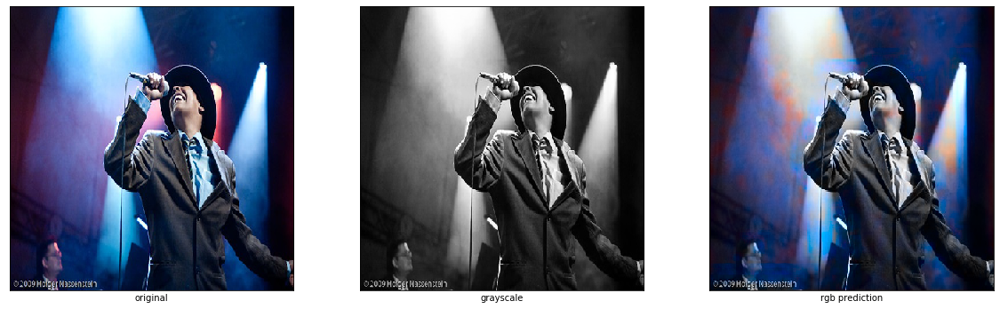

(1, 400, 400, 1)
(1, 400, 400, 2)


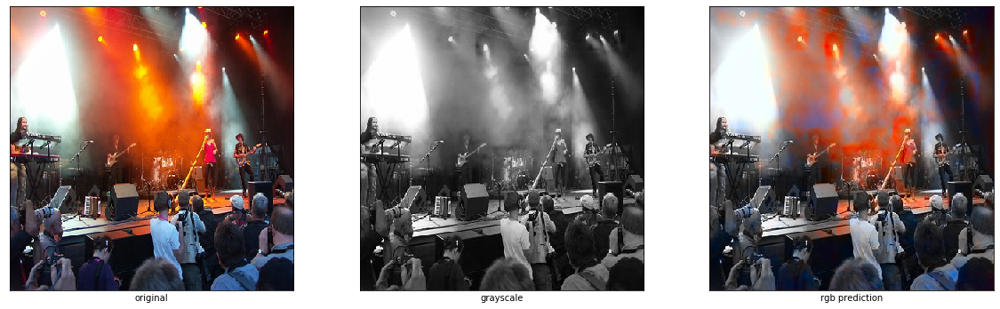

(1, 400, 400, 1)
(1, 400, 400, 2)


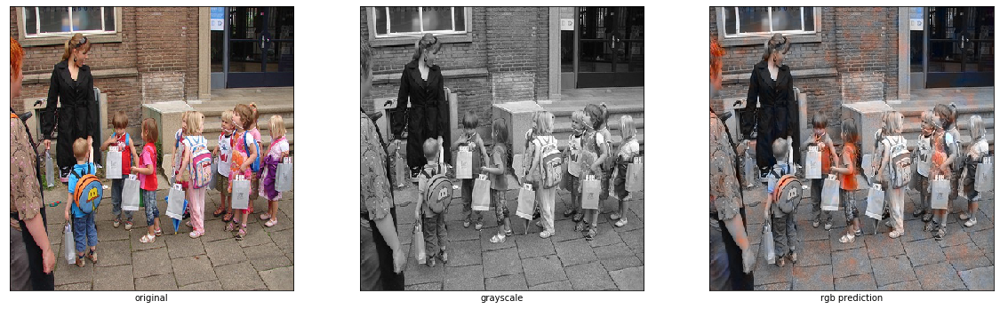

(1, 400, 400, 1)
(1, 400, 400, 2)


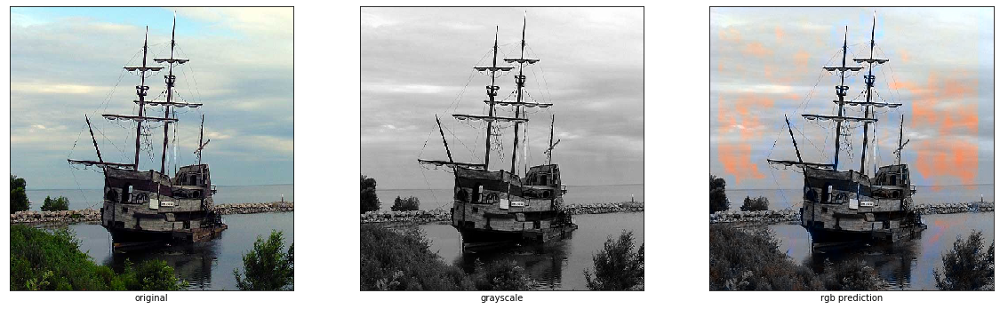

(1, 400, 400, 1)
(1, 400, 400, 2)


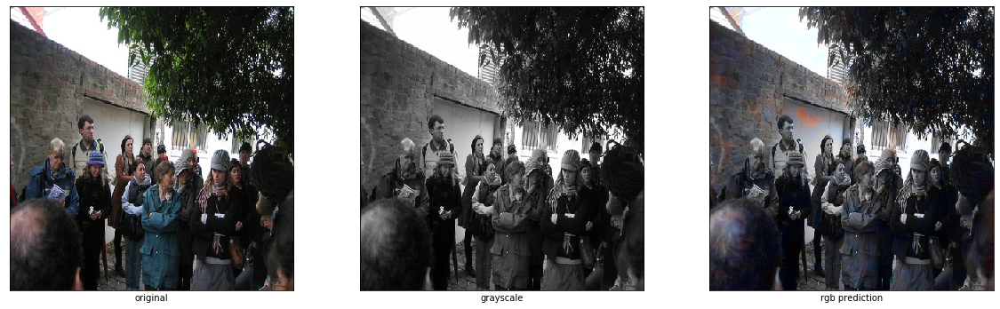

(1, 400, 400, 1)
(1, 400, 400, 2)


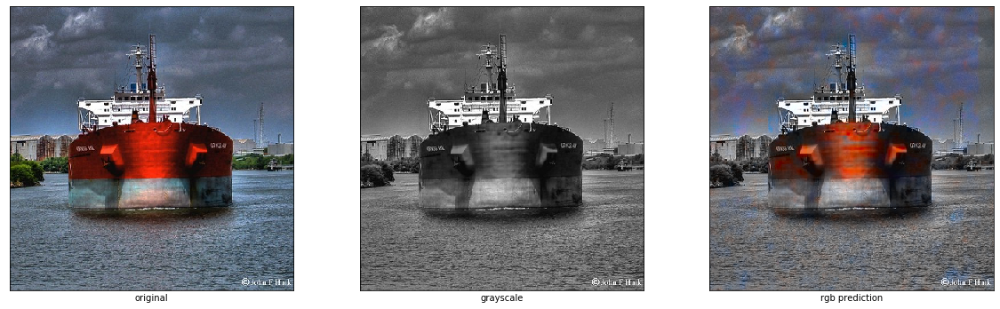

(1, 400, 400, 1)
(1, 400, 400, 2)


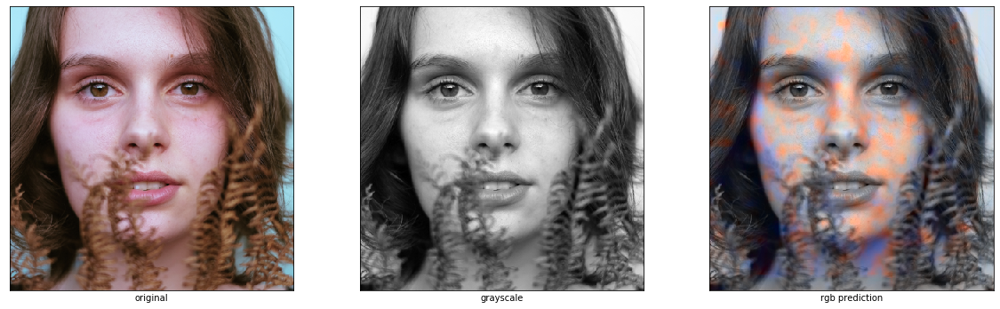

(1, 400, 400, 1)
(1, 400, 400, 2)


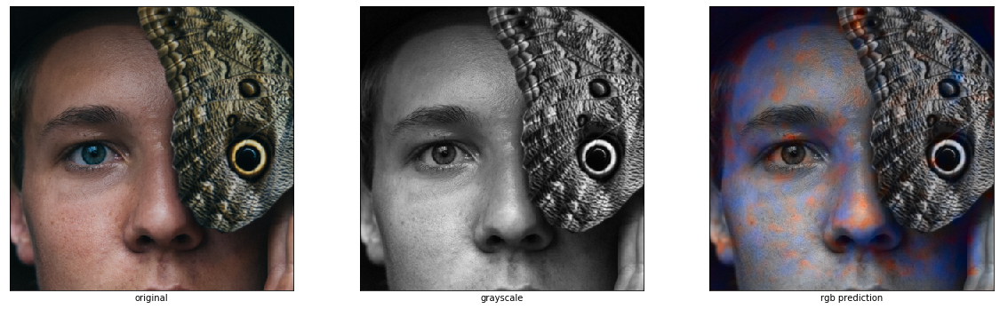

In [145]:
for ind in range(len(images_and_arrs)):
    test_image, test_arr = images_and_arrs[ind]
    test_x, test_y = convert_rgb2lab(test_arr)
    predict(new_model, test_image, test_x.reshape(1, IMAGE_SIZE, IMAGE_SIZE, 1))

test_image, test_arr = load_img_to_np_array("woman.jpg", show_image=False)
test_x, test_y = convert_rgb2lab(test_arr)
predict(new_model, test_image, test_x.reshape(1, IMAGE_SIZE, IMAGE_SIZE, 1))

test_image, test_arr = load_img_to_np_array("man.jpg", show_image=False)
test_x, test_y = convert_rgb2lab(test_arr)
predict(new_model, test_image, test_x.reshape(1, IMAGE_SIZE, IMAGE_SIZE, 1))

(1, 400, 400, 1)
(1, 400, 400, 2)


/anaconda3/lib/python3.6/site-packages/skimage/color/colorconv.py:988: UserWarning: Color data out of range: Z < 0 in 53 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


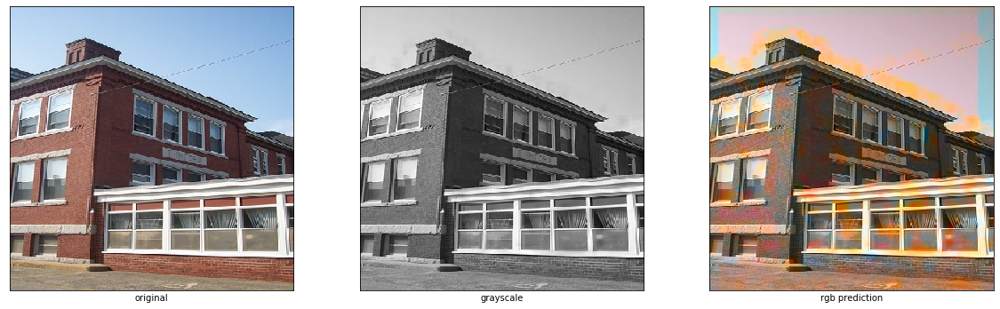

(1, 400, 400, 1)
(1, 400, 400, 2)


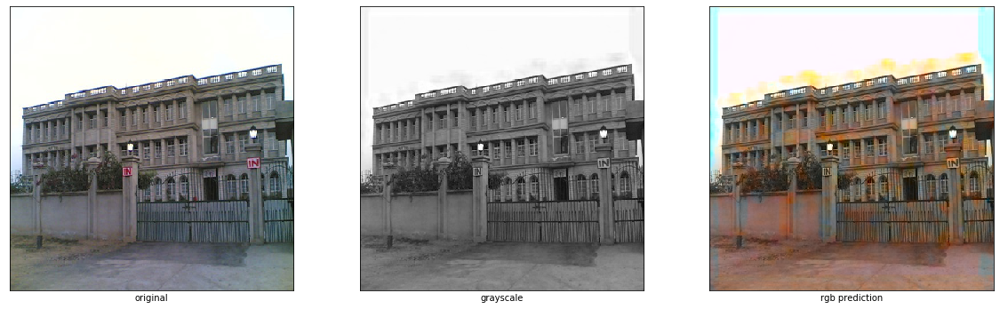

(1, 400, 400, 1)
(1, 400, 400, 2)


/anaconda3/lib/python3.6/site-packages/skimage/color/colorconv.py:988: UserWarning: Color data out of range: Z < 0 in 149 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


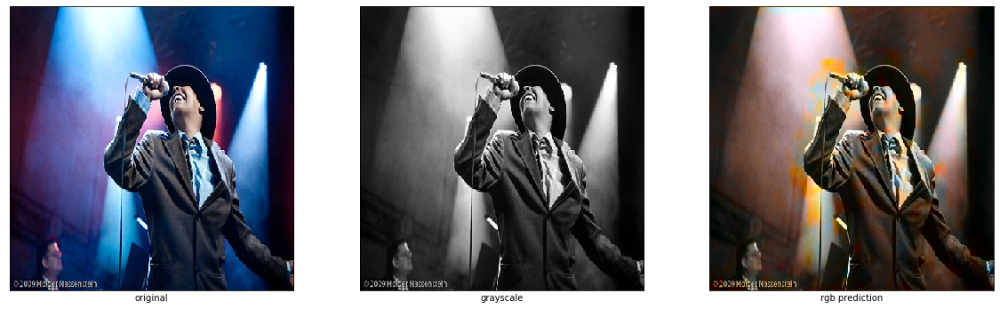

(1, 400, 400, 1)
(1, 400, 400, 2)


/anaconda3/lib/python3.6/site-packages/skimage/color/colorconv.py:988: UserWarning: Color data out of range: Z < 0 in 102 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


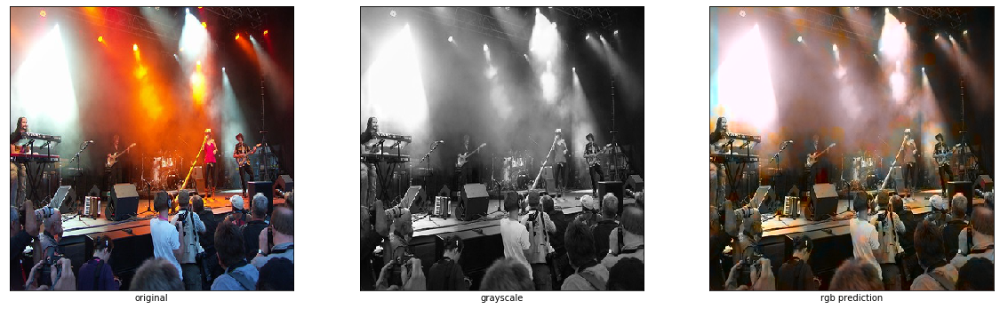

(1, 400, 400, 1)
(1, 400, 400, 2)


/anaconda3/lib/python3.6/site-packages/skimage/color/colorconv.py:988: UserWarning: Color data out of range: Z < 0 in 90 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


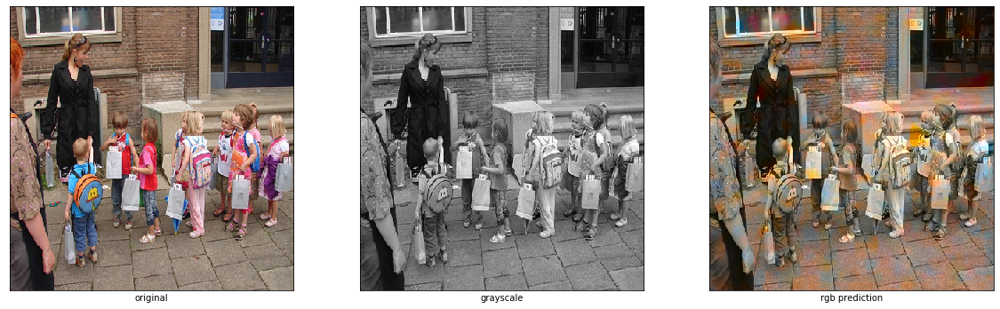

(1, 400, 400, 1)
(1, 400, 400, 2)


/anaconda3/lib/python3.6/site-packages/skimage/color/colorconv.py:988: UserWarning: Color data out of range: Z < 0 in 257 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


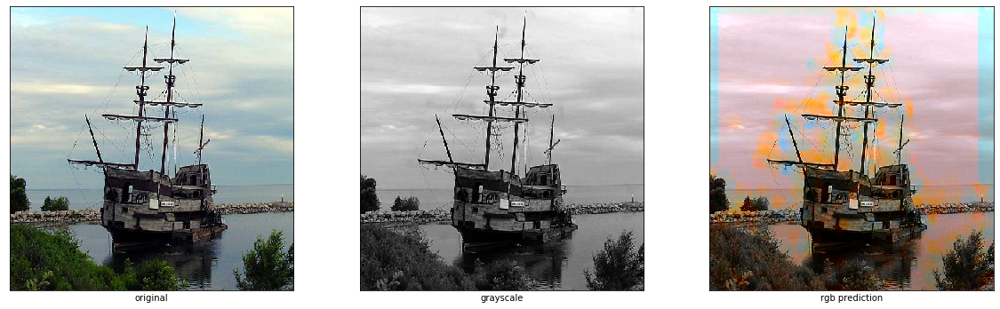

(1, 400, 400, 1)
(1, 400, 400, 2)


/anaconda3/lib/python3.6/site-packages/skimage/color/colorconv.py:988: UserWarning: Color data out of range: Z < 0 in 101 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


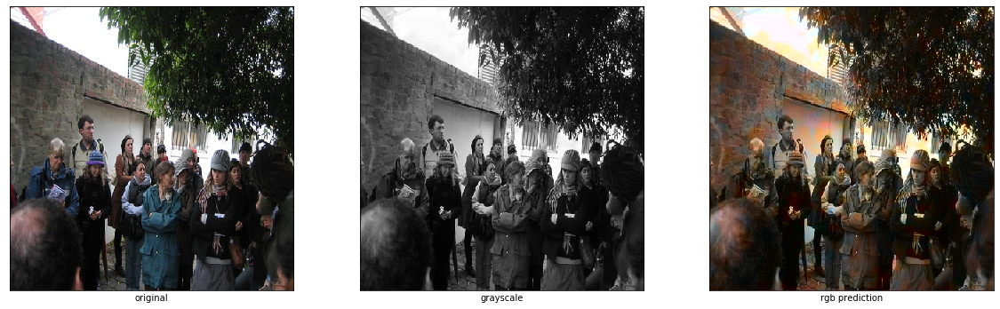

(1, 400, 400, 1)
(1, 400, 400, 2)


/anaconda3/lib/python3.6/site-packages/skimage/color/colorconv.py:988: UserWarning: Color data out of range: Z < 0 in 51 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


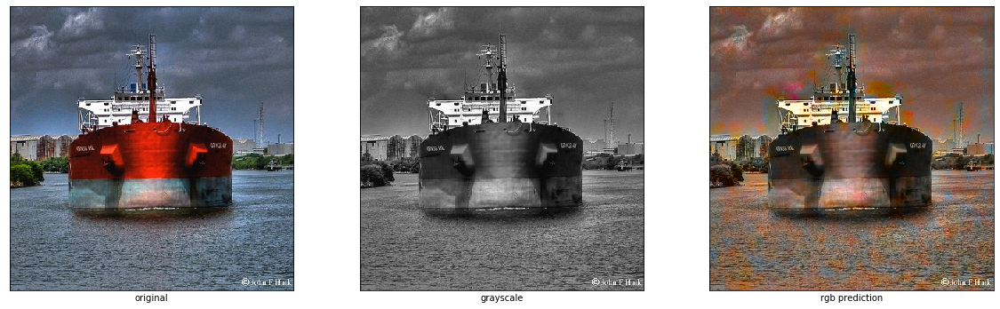

(1, 400, 400, 1)
(1, 400, 400, 2)


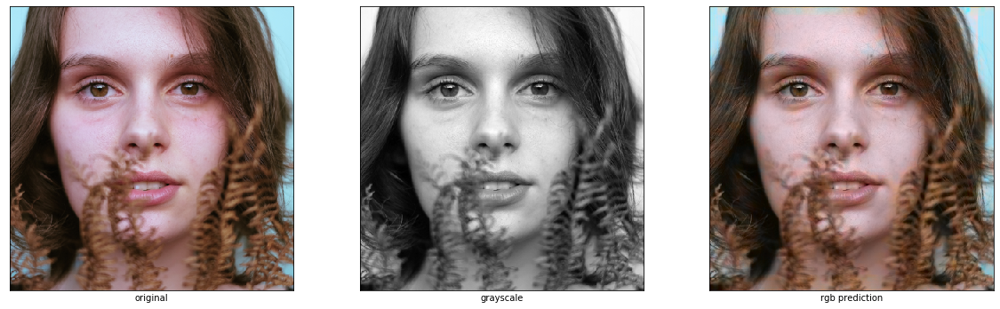

(1, 400, 400, 1)
(1, 400, 400, 2)


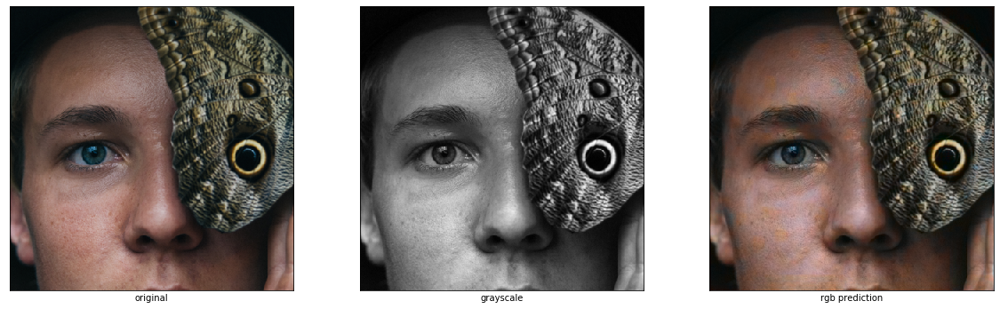

In [146]:
for ind in range(len(images_and_arrs)):
    test_image, test_arr = images_and_arrs[ind]
    test_x, test_y = convert_rgb2lab(test_arr)
    predict(first_model, test_image, test_x.reshape(1, IMAGE_SIZE, IMAGE_SIZE, 1))

test_image, test_arr = load_img_to_np_array("woman.jpg", show_image=False)
test_x, test_y = convert_rgb2lab(test_arr)
predict(first_model, test_image, test_x.reshape(1, IMAGE_SIZE, IMAGE_SIZE, 1))

test_image, test_arr = load_img_to_np_array("man.jpg", show_image=False)
test_x, test_y = convert_rgb2lab(test_arr)
predict(first_model, test_image, test_x.reshape(1, IMAGE_SIZE, IMAGE_SIZE, 1))